lena_url: https://drive.google.com/file/d/1Jg7hBp5g8WhjQXx91crswMpIDEvCKtIj/view

In [ ]:
from google.colab.patches import cv2_imshow
from itertools import permutations
import copy

##Домашняя работа #1.
##Image pre-processing.

В этой домашней работе мы попробуем поприменять самые простые способы обработки изображений.

* Soft deadline: **20.02.2023 03:00:00 +0003 GMT** 
* Hard deadline: **27.02.2023 03:00:00 +0003 GMT**

In [ ]:
import cv2
import matplotlib.pylab as plt
%matplotlib inline

import numpy as np

##### Задача 1 (3 балла)

Загрузите изображение *lena.png* в переменную **lena**. Отобразите результат на экран. Убедитесь, что `opencv` открывает изображение в формате BGR, переведите его в RGB несколькими способами: 
* c помощью функций split & merge
* с помощью индексации в numpy 
* с помощью cvtColor

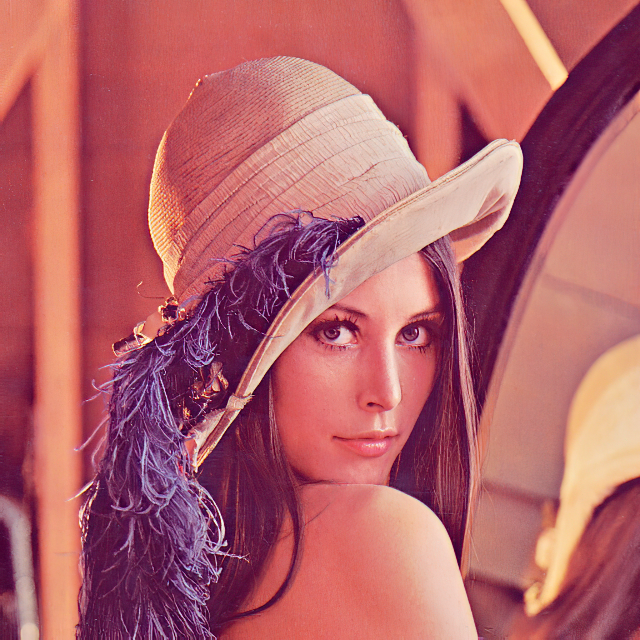

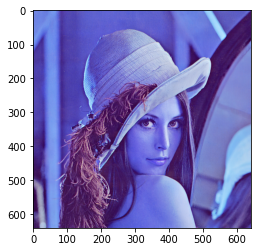

In [ ]:
lena = cv2.imread('lena.png')
lena = cv2.resize(lena, (640, 640))
cv2_imshow(lena)
plt.imshow(lena)
#я так понял cv2_imshow работает в rgb

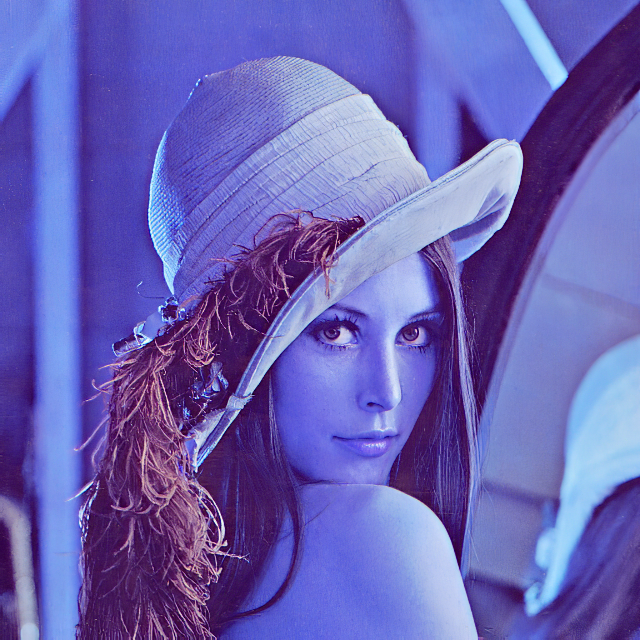

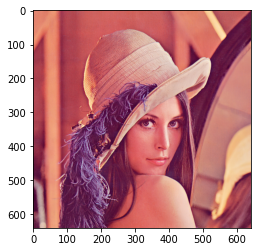

In [ ]:
lena_rgb = cv2.cvtColor(lena, cv2.COLOR_BGR2RGB)
cv2_imshow(lena_rgb)
plt.imshow(lena_rgb)

В RGB с помощью split & merge

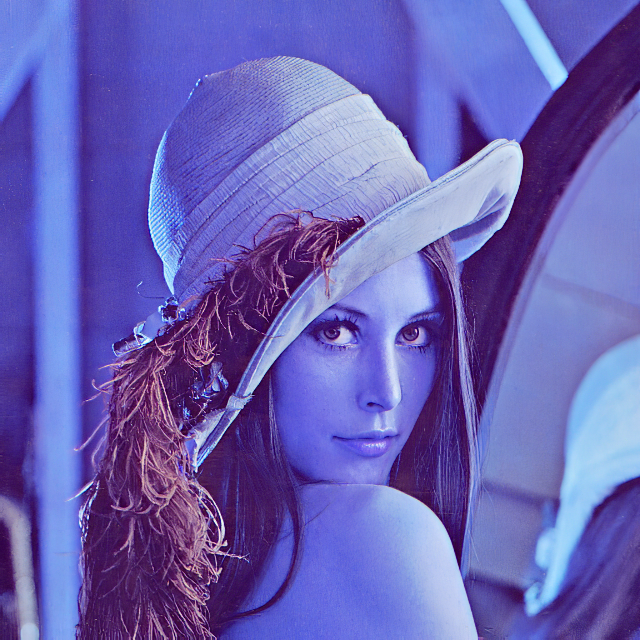

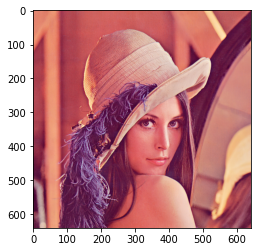

In [ ]:
blue,green,red = cv2.split(lena)
lena_rgb = cv2.merge([red,green,blue]);
cv2_imshow(lena_rgb)
plt.imshow(lena_rgb)

В RGB с помощью индексации в numpy

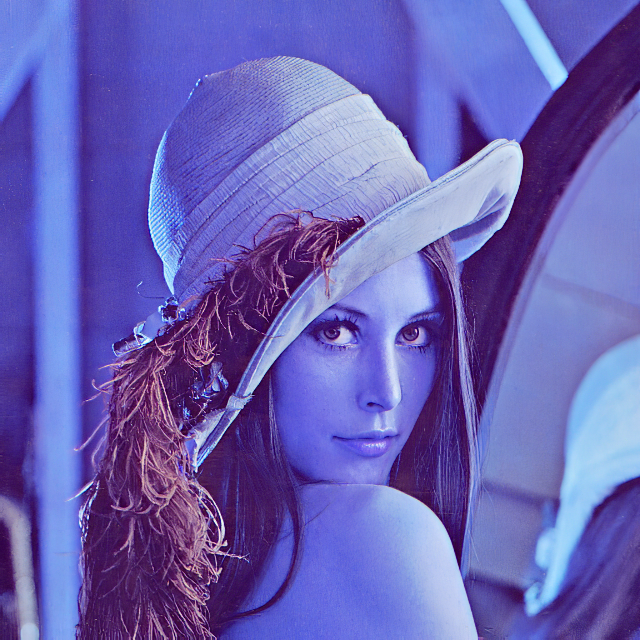

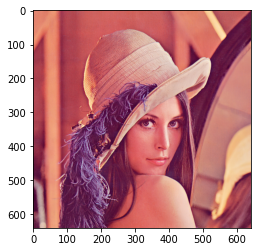

In [ ]:
lena_rgb = lena[...,::-1]
cv2_imshow(lena_rgb)
plt.imshow(lena_rgb)

##### Задача 2 (3 балла)

Поменяйте местами левую верхнюю и правую нижнюю четвертинки изображения **lena** и отобразите результат на экран.

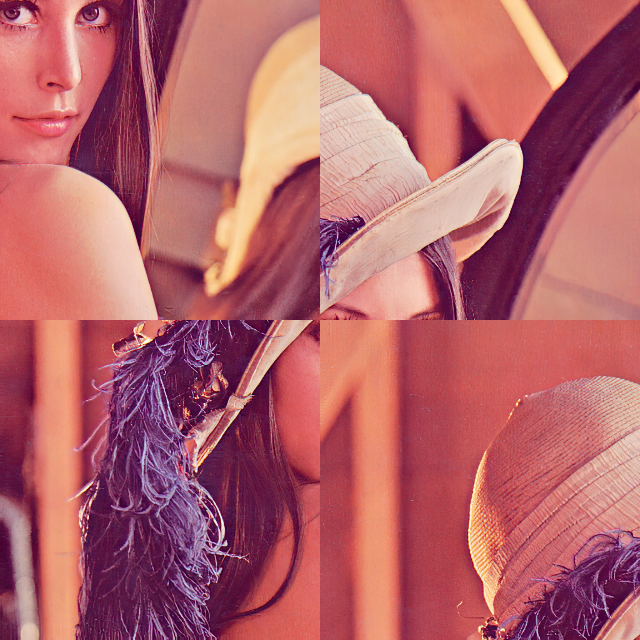

In [ ]:
h, w = lena.shape[0:2]
x_center, y_center = w//2, h//2
top_left = lena[0:x_center, 0:y_center]
bottom_right = lena[x_center:, y_center:]
# cv2_imshow(bottom_right)
lena_switched = copy.deepcopy(lena)
lena_switched[0:y_center, 0:x_center]  = bottom_right
lena_switched[y_center:, x_center:]  = top_left
cv2_imshow(lena_switched)

##### Задача 3 (3 балла)

Усредните значения всех трех цветовых каналов **lena** в каждый из каналов итогового изображения **lena_gray_my**. Переведите исходное цветное изображение lena в изображение в градациях серого с помощью функции cvtColor. (lena_gray_cvt). Вычислите модуль разности между изображениями **lena_gray_my** и **lena_gray_cvt** и отобразите ее на экране. 

float64


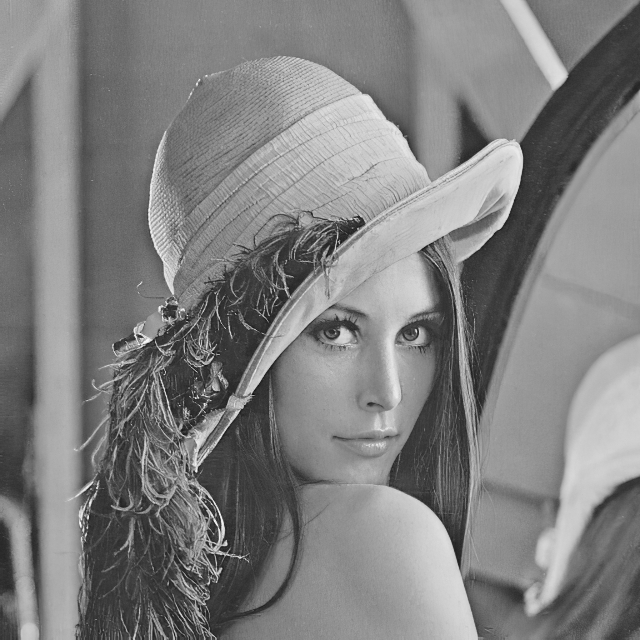

In [ ]:
lena_gray_my = np.mean(lena, axis=2)
print(lena_gray_my.dtype)
cv2_imshow(lena_gray_my)

uint8


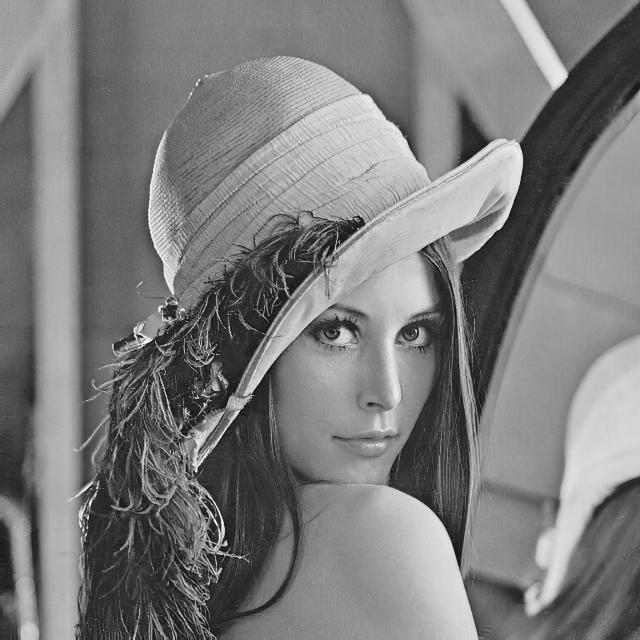

In [ ]:
lena_gray_cvt = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
print(lena_gray_cvt.dtype)
cv2_imshow(lena_gray_cvt)

float64


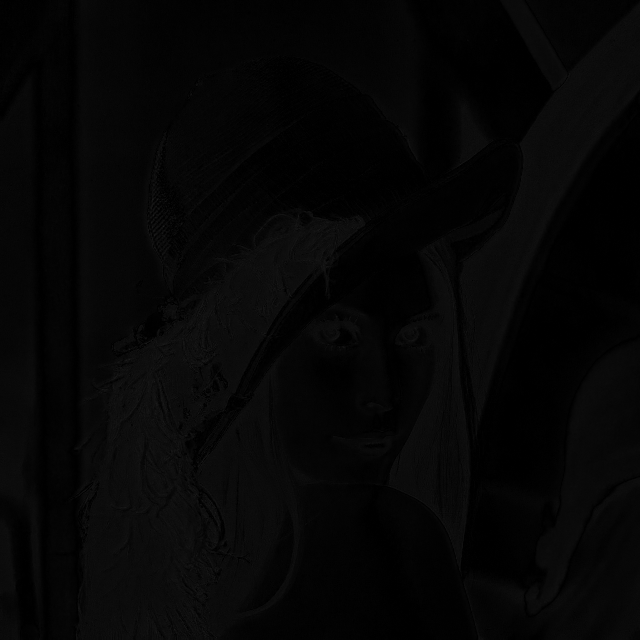

In [ ]:
print((np.abs(lena_gray_cvt - lena_gray_my)).dtype)
cv2_imshow(np.abs(lena_gray_cvt - lena_gray_my))

In [ ]:
lena_gray_cvt64 = lena_gray_cvt.astype('float64')
np.array_equal(np.abs(lena_gray_cvt64 - lena_gray_my),
           np.abs(lena_gray_cvt - lena_gray_my))

True

False


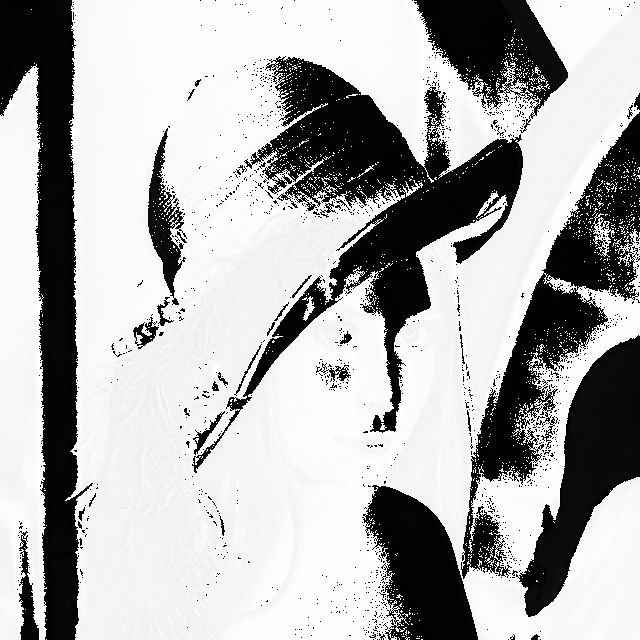

In [ ]:
lena_gray_my_uint8 = lena_gray_my.astype('uint8')
print(np.array_equal(np.abs(lena_gray_cvt - lena_gray_my_uint8),
           np.abs(lena_gray_cvt - lena_gray_my)))
cv2_imshow(np.abs(lena_gray_cvt - lena_gray_my_uint8))

##### Задача 4 (3 балла)
Переведите изображение **lena** в одно из цветовых пространств (cvtColor) с выделенной координатой яркости (HSV, HSL, HSB, CIE Lab), инвертируйте яркостную составляющую, переведите обратно в RGB. Отобразите результат.

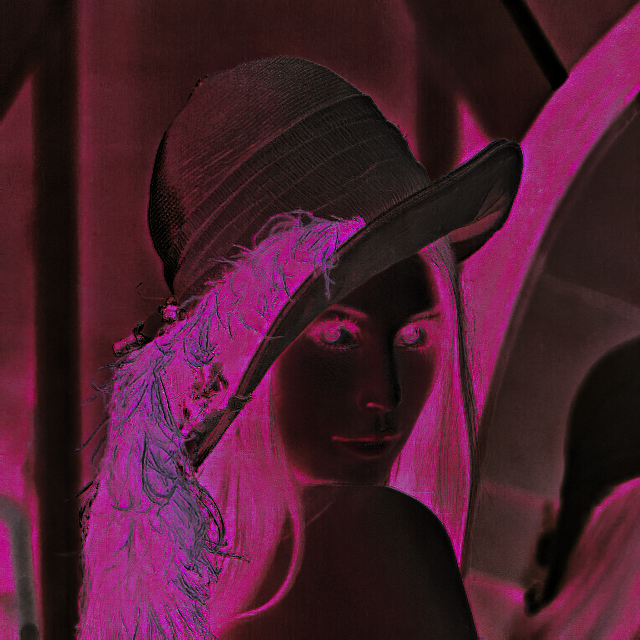

In [ ]:
lena_hsv = cv2.cvtColor(lena, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(lena_hsv)
v = 255-v
lena_hsv = cv2.merge([h,s,v])
lena_bright = cv2.cvtColor(lena_hsv, cv2.COLOR_HSV2BGR)
cv2_imshow(lena_bright)

##### Задача 5 (3 балла)

По цветному изображению **lena** на входе сгенерируйте 6 цветных изображений, полученных путем перестановки значений цветовых каналов r, g и b. исходного изображения. Соберите коллаж $3x2$ и отобразите его на экране. 

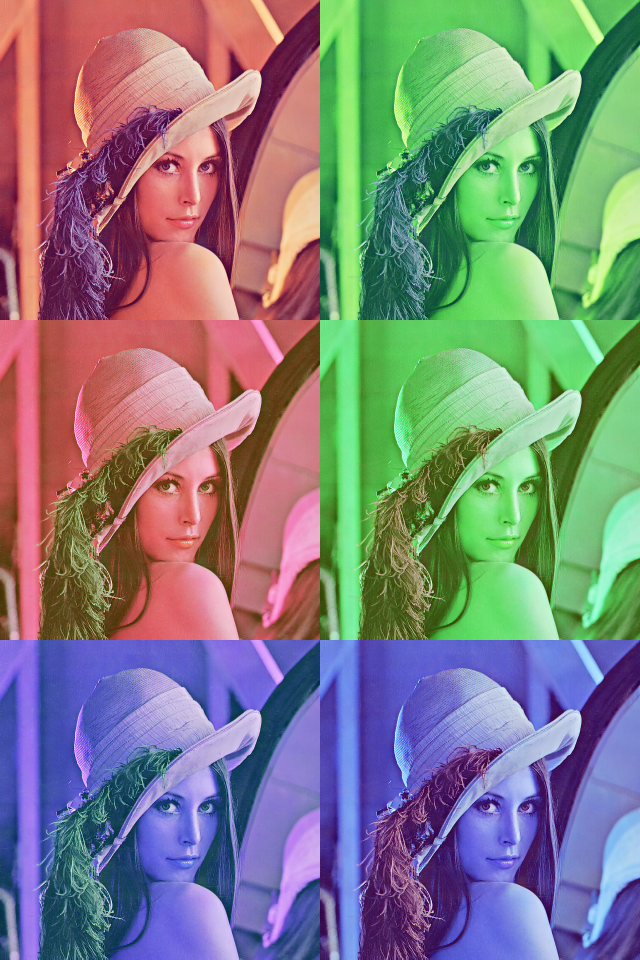

In [ ]:
# blue,green,red = cv2.split(lena)
bgr_perm = list(permutations(cv2.split(lena),3))
imgs_perm = list(map(lambda v:cv2.merge(v) , bgr_perm))
lvl_1 = np.vstack([imgs_perm[0], imgs_perm[2], imgs_perm[4]])
lvl_2 = np.vstack([imgs_perm[1], imgs_perm[3], imgs_perm[5]])
collage = np.hstack([lvl_1, lvl_2])
collage = cv2.resize(collage, (640, 960))
cv2_imshow(collage)

####Задача 6 (3 балла)
Переведите изображение **lena** в градации серого. Примените к серому изображению операцию линейного растяжения диапазона яркостей ( 𝑛𝑜𝑟𝑚𝑎𝑙𝑖𝑧𝑒 ) и эквализации гистограммы ( 𝑒𝑞𝑢𝑎𝑙𝑖𝑧𝑒𝐻𝑖𝑠𝑡 ). Постройте разность полученных результатов. Состыкуйте в одно изображение в градациях серого результат линейного растяжения, эквализации и их разности

uint8
uint8
uint8
uint8


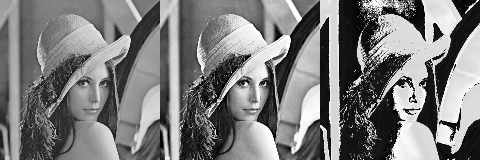

In [ ]:
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
print(lena_gray.dtype)
norm_gray_lena = cv2.normalize(lena_gray, None, 0, 255, cv2.NORM_MINMAX)
print(norm_gray_lena.dtype)
equ_gray_lena = cv2.equalizeHist(lena_gray)
print(equ_gray_lena.dtype)
diff_norm_equ = np.abs(norm_gray_lena - equ_gray_lena)
print(diff_norm_equ.dtype)
collage_gray = np.hstack([norm_gray_lena, equ_gray_lena, diff_norm_equ])
collage_gray = cv2.resize(collage_gray, (480, 160))
cv2_imshow(collage_gray)

True


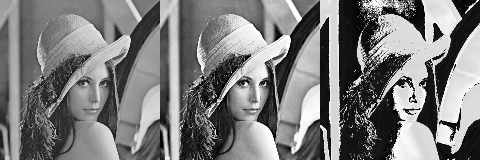

In [ ]:
lena_gray64 = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY).astype("float64")
norm_gray_lena64 = cv2.normalize(lena_gray, None, 0, 255, cv2.NORM_MINMAX)
equ_gray_lena64 = cv2.equalizeHist(lena_gray).astype("float64")
diff_norm_equ64 = np.abs(norm_gray_lena - equ_gray_lena).astype("float64")
collage_gray64 = np.hstack([norm_gray_lena, equ_gray_lena, diff_norm_equ])
collage_gray64 = cv2.resize(collage_gray, (480, 160))
print(np.array_equal(collage_gray64,collage_gray))
cv2_imshow(collage_gray64)

####Задача 7 (3 балла)
Реализуйте функцию добавления шума «соль и перец» для одноканального изображения. Входные параметры: $src$ – исходная одноканальная матрица $Mat$, $p$ – вероятность замещения исходных значений на $0$, $q$ – вероятность замещения исходных значений на $255$. Загрузите изображение $lena.jpg$, выделите каналы изображения в отдельные матрицы ($split$), добавьте шум «соль и перец» в каждый канал при помощи реализованной Вами функции с параметрами

1. $p=q=0.05$
2. $p=q=0.1$
3. $p=q=0.15$

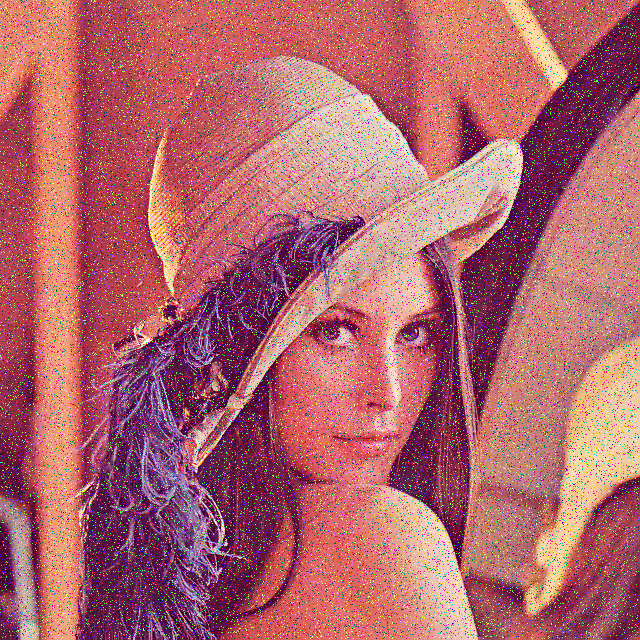

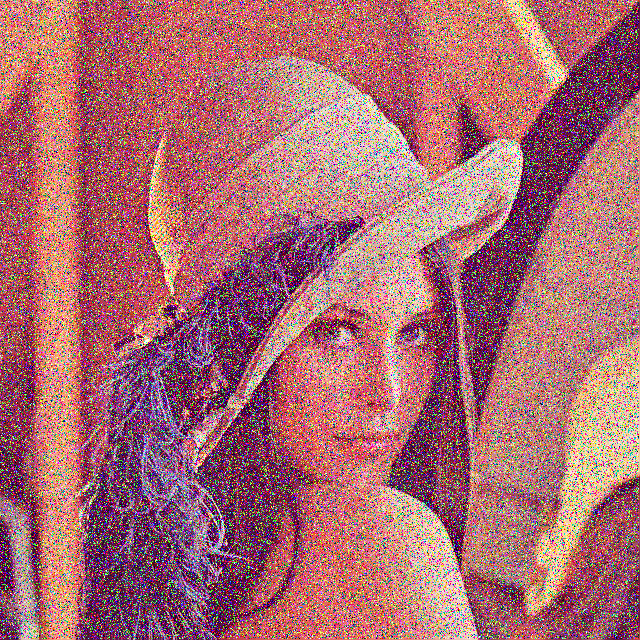

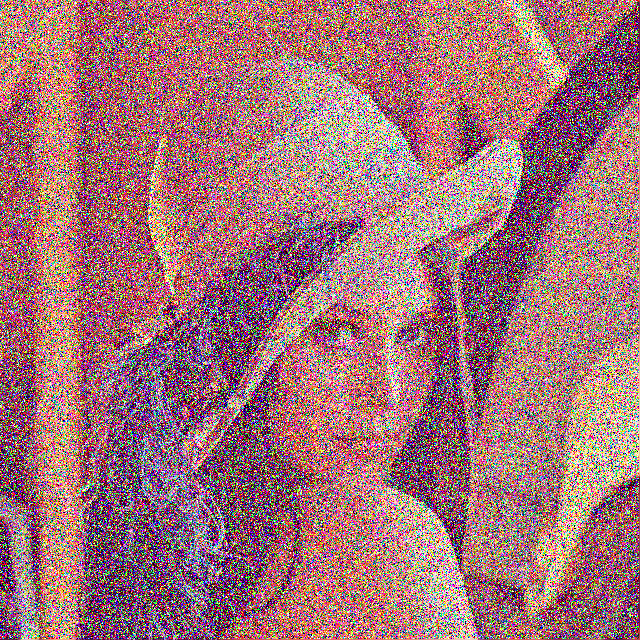

In [ ]:
def change_rand_pixels(Mat, num_of_pixels, brightness):
  for i in range(num_of_pixels):
    y_rand = np.random.randint(0, Mat.shape[0]-1)
    x_rand = np.random.randint(0, Mat.shape[1]-1)
    Mat[y_rand][x_rand] = brightness

def salt_pepper(Mat, p, q):
  pepper_pixels = int(Mat.shape[0]*Mat.shape[1]*p)
  salt_pixels = int(Mat.shape[0]*Mat.shape[1]*q)
  change_rand_pixels(Mat, pepper_pixels, 0)
  change_rand_pixels(Mat, salt_pixels, 255)
  # for i in range(pepper_pixels):
  #   y_rand = np.random.randint(0, Mat.shape[0]-1)
  #   x_rand = np.random.randint(0, Mat.shape[1]-1)
  #   Mat[y_rand][x_rand] = 0
  # for i in range(salt_pixels):
  #   y_rand = np.random.randint(0, Mat.shape[0]-1)
  #   x_rand = np.random.randint(0, Mat.shape[1]-1)
  #   Mat[y_rand][x_rand] = 255
  return Mat

p_q = [(0.05,0.05), (0.1, 0.1), (0.15, 0.15)]
channels = cv2.split(lena)
for p,q in p_q:
  for channel in channels:
    channel = salt_pepper(channel, p, q)
  cv2_imshow(cv2.merge(channels))

####Задча 8 (3 балла)
Реализуйте функцию пространственной фильтрации изображения однородным усредняющим фильтром размера $n \times n$ (все коэффициенты маски равны $\frac{1}{n^2}$). При вычислении среднего используйте тот факт, что при переходе от точки к точке обновляется только часть элементов изображения под маской. Примените реализованный фильтр к предварительно переведенному в градации серого изображению $lena.jpg$ при $n = 3$ и $n = 5$. Визуализируйте изображение, представляющее собой разность полученных результатов фильтрации.

In [ ]:
def avg_filter(n, img):
    img_padd = np.pad(img, n // 2)
    res = np.zeros((img_padd.shape[0], img_padd.shape[1]))

    k = 1 / (n ** 2)
    for i in range(n // 2, img_padd.shape[0] - n // 2):
        prev_col_sum = 0
        prev_sum = k * np.sum(img_padd[i - n // 2:i + n // 2 + 1, 0:n - 1])
        for j in range(n // 2, img_padd.shape[1] - n // 2):
            res[i][j] = prev_sum - prev_col_sum + \
                k * np.sum(img_padd[i - n // 2:i + n // 2 + 1, j + n // 2])
            prev_col_sum = k * \
                np.sum(img_padd[i - n // 2:i + n // 2 + 1, j - n // 2])
            prev_sum = res[i][j]

    res = res.astype(int)
    return res[n // 2:img_padd.shape[0] - n // 2, 
               n // 2:img_padd.shape[1] - n // 2]

img = np.ones((4, 5)) * 9
map = avg_filter(3, img)
print(map)

[[4 6 6 6 4]
 [6 9 9 9 6]
 [6 9 9 9 6]
 [4 6 6 6 4]]


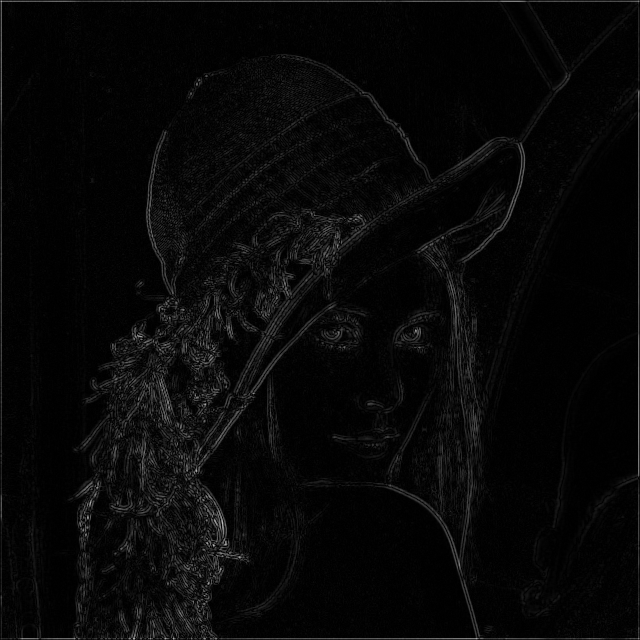

In [ ]:
lena_gray = cv2.cvtColor(lena, cv2.COLOR_BGR2GRAY)
lena_avg_filter3 = avg_filter(3, lena)
lena_avg_filter5 = avg_filter(5, lena)

# cv2_imshow(lena_avg_filter3)
# cv2_imshow(lena_avg_filter5)
cv2_imshow(np.abs(lena_avg_filter3 - lena_avg_filter5))

####Задача 9 (6 баллов) 
С помощью [виджетов](https://ipywidgets.readthedocs.io/en/latest/examples/Widget%20List.html) создайте 2 слайдера с настройками параметров гамма-коррекции. Отобразите **lena**, ее гамма-преобразование и график в диапозоне от [0;1], так, чтобы параметры слайдера соответствовали параметрам гамма-коррекции. Отдельно выведите изображение **lena** с гаммой равной 2.

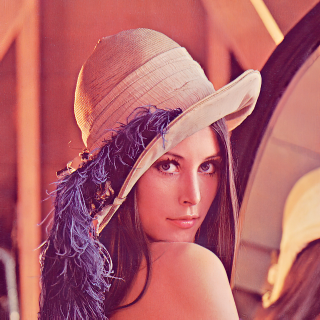

lena type: uint8


interactive(children=(FloatSlider(value=1.0, continuous_update=False, description='const', max=3.0, readout_fo…


lena(uint8) with gamma = 2:


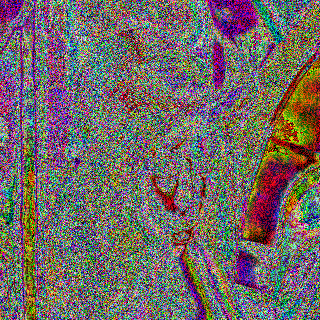


lena(float64) with gamma = 2:


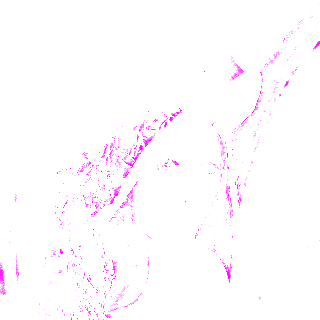

In [ ]:
lena = cv2.resize(lena, (320, 320))
cv2_imshow(lena)
print("lena type:", lena.dtype)
import ipywidgets

def lena_gamma(c,d):
  new_lena = c*((lena.astype("float64"))**d)
  plt.axis([0,1,0,1])
  x = np.arange(0,1.1,0.1)
  y = c*(x**d)
  plt.plot(x,y)
  cv2_imshow(new_lena)


ipywidgets.interact(lena_gamma, c = ipywidgets.FloatSlider(min=0,max=3,step=0.2,
                                                      value = 1,
                                                      description='const',
                                                      disabled=False,
                                                      continuous_update=False,
                                                      orientation='horizontal',
                                                      readout=True,
                                                      readout_format='.1f'),
                                d = ipywidgets.FloatSlider(min=0.,max=2,step=0.1,
                                                      value = 1,
                                                      description='gamma',
                                                      disabled=False,
                                                      continuous_update=False,
                                                      orientation='horizontal',
                                                      readout=True,
                                                      readout_format='.1f'))

print("\nlena(uint8) with gamma = 2:")
cv2_imshow(lena**2)
print("\nlena(float64) with gamma = 2:")
cv2_imshow(lena**2.0)